In [73]:
import requests
import shutil
import os
import pandas as pd
import numpy as np
import re
from itertools import zip_longest
from tqdm.notebook import trange, tqdm
import folium 
import matplotlib.pyplot as plt
import seaborn as sns
import requests
import json
import pprint


%matplotlib inline
%config InlineBackend.figure_format='retina'


from pathlib import Path

%matplotlib inline

In [127]:
# Download the Gender pay gap data from UK Gov if it's not already there
def download_file_if_not_exist(url, target_dir='data', extension='', filename=None):
    local_filename = filename if filename is not None else url.split('/')[-1] + extension

    Path(target_dir).mkdir(parents=True, exist_ok=True)
    test_path = Path(os.path.join(target_dir, local_filename ))
    if test_path.is_file():
        print("{} already exists in {}".format(local_filename, target_dir))
        return
                     
    print("Downloading {} to {}".format(local_filename, target_dir))
    with requests.get(url, stream=True) as r:
        with test_path.open('wb') as f:
            shutil.copyfileobj(r.raw, f)

    return local_filename 

for year in (2017, 2018, 2019):
    download_file_if_not_exist('https://gender-pay-gap.service.gov.uk/viewing/download-data/{}'.format(year), 
                               target_dir='data/gender-pay-gap-uk-gov',
                              extension=".csv.gz")


2017.csv.gz already exists in data/gender-pay-gap-uk-gov
2018.csv.gz already exists in data/gender-pay-gap-uk-gov
2019.csv.gz already exists in data/gender-pay-gap-uk-gov


In [279]:
# Take a peek at 2017
df1 = pd.read_csv('data/gender-pay-gap-uk-gov/2017.csv.gz',  compression='gzip')
df2 = pd.read_csv('data/gender-pay-gap-uk-gov/2018.csv.gz',  compression='gzip')
df3 = pd.read_csv('data/gender-pay-gap-uk-gov/2019.csv.gz',  compression='gzip')
df1['year'] = 2017
df2['year'] = 2018
df3['year'] = 2019
df = pd.concat([df1, df2, df3])
del df1, df2, df3
df.head()

,EmployerName,Address,CompanyNumber,SicCodes,DiffMeanHourlyPercent,DiffMedianHourlyPercent,DiffMeanBonusPercent,DiffMedianBonusPercent,MaleBonusPercent,FemaleBonusPercent,...,MaleTopQuartile,FemaleTopQuartile,CompanyLinkToGPGInfo,ResponsiblePerson,EmployerSize,CurrentName,SubmittedAfterTheDeadline,DueDate,DateSubmitted,year
0,"""Bryanston School"",Incorporated","Bryanston House,\r\nBlandford,\r\nDorset,\r\nD...",00226143,85310,18.0,28.2,0.0,0.0,0.0,0.0,...,51.5,48.5,https://www.bryanston.co.uk/employment,Nick McRobb (Bursar and Clerk to the Governors),500 to 999,BRYANSTON SCHOOL INCORPORATED,False,05/04/2018 00:00:00,27/03/2018 11:42:49,2017
1,"""RED BAND"" CHEMICAL COMPANY, LIMITED","19 Smith's Place,\r\nLeith Walk,\r\nEdinburgh,...",SC016876,47730,2.3,-2.7,15.0,37.5,15.6,66.7,...,18.1,81.9,NaN,Philip Galt (Managing Director),250 to 499,"""RED BAND"" CHEMICAL COMPANY, LIMITED",False,05/04/2018 00:00:00,28/03/2018 16:44:25,2017
2,118 LIMITED,"3 Alexandra Gate Ffordd Pengam,\r\nGround Floo...",03951948,61900,1.7,2.8,13.1,13.6,70.0,57.0,...,58.0,42.0,NaN,"Emma Crowe (VP, Human Resources)",500 to 999,118 LIMITED,False,05/04/2018 00:00:00,27/03/2018 19:10:41,2017
3,123 EMPLOYEES LTD,"34 Roundhay Road,\r\nLeeds,\r\nEngland,\r\nLS7...",10530651,78300,41.0,36.0,-69.8,-157.2,50.0,73.5,...,23.0,77.0,NaN,Chloe Lines (Financial Controller),250 to 499,123 EMPLOYEES LTD,True,05/04/2018 00:00:00,04/05/2018 11:24:06,2017
4,1610 LIMITED,"Hestercombe House,\r\nCheddon Fitzpaine,\r\nTa...",06727055,93110,-22.0,-34.0,-47.0,-67.0,25.0,75.0,...,24.0,76.0,https://www.1610.org.uk/gender-pay-gap/,Tim Nightingale (CEO),250 to 499,1610 LIMITED,True,05/04/2018 00:00:00,12/04/2018 17:03:26,2017


In [281]:
df.count()
16846/23777

0.7084998107414728

In [139]:

# Drop cols we don't care about
del df['SubmittedAfterTheDeadline']
del df['DueDate']
del df['DateSubmitted']
del df['CompanyNumber']
del df['CompanyLinkToGPGInfo']
del df['ResponsiblePerson']

def clean_address(addr):
    tmp = addr.strip()
    tmp = tmp.split('\r\n')
    tmp = map(lambda x: x.split(','), tmp)
    # flatten
    tmp = [item for sublist in tmp for item in sublist]
    tmp = filter(lambda x: len(x) > 0, tmp)
    tmp = map(lambda x: x.strip(), tmp)
    tmp = [re.sub(',', ',,', x) for x in tmp]
    return tmp

df['Address'] = df.Address.astype(str).map(clean_address)
df['Postcode'] = df.Address.map(lambda x: x[-1])
df.head(5)

,EmployerName,Address,SicCodes,DiffMeanHourlyPercent,DiffMedianHourlyPercent,DiffMeanBonusPercent,DiffMedianBonusPercent,MaleBonusPercent,FemaleBonusPercent,MaleLowerQuartile,...,MaleLowerMiddleQuartile,FemaleLowerMiddleQuartile,MaleUpperMiddleQuartile,FemaleUpperMiddleQuartile,MaleTopQuartile,FemaleTopQuartile,EmployerSize,CurrentName,year,Postcode
0,"""Bryanston School"",Incorporated","[Bryanston House, Blandford, Dorset, DT11 0PX]",85310,18.0,28.2,0.0,0.0,0.0,0.0,24.4,...,50.8,49.2,49.2,50.8,51.5,48.5,500 to 999,BRYANSTON SCHOOL INCORPORATED,2017,DT11 0PX
1,"""RED BAND"" CHEMICAL COMPANY, LIMITED","[19 Smith's Place, Leith Walk, Edinburgh, EH6 ...",47730,2.3,-2.7,15.0,37.5,15.6,66.7,20.3,...,25.4,74.6,10.3,89.7,18.1,81.9,250 to 499,"""RED BAND"" CHEMICAL COMPANY, LIMITED",2017,EH6 8NU
2,118 LIMITED,"[3 Alexandra Gate Ffordd Pengam, Ground Floor,...",61900,1.7,2.8,13.1,13.6,70.0,57.0,51.0,...,53.0,47.0,50.0,50.0,58.0,42.0,500 to 999,118 LIMITED,2017,CF24 2SA
3,123 EMPLOYEES LTD,"[34 Roundhay Road, Leeds, England, LS7 1AB]",78300,41.0,36.0,-69.8,-157.2,50.0,73.5,0.0,...,2.0,98.0,11.0,89.0,23.0,77.0,250 to 499,123 EMPLOYEES LTD,2017,LS7 1AB
4,1610 LIMITED,"[Hestercombe House, Cheddon Fitzpaine, Taunton...",93110,-22.0,-34.0,-47.0,-67.0,25.0,75.0,56.0,...,52.0,48.0,30.0,70.0,24.0,76.0,250 to 499,1610 LIMITED,2017,TA2 8LG


EmployerName                 23777
Address                      23777
SicCodes                     22585
DiffMeanHourlyPercent        23777
DiffMedianHourlyPercent      23777
DiffMeanBonusPercent         21225
DiffMedianBonusPercent       21225
MaleBonusPercent             23777
FemaleBonusPercent           23777
MaleLowerQuartile            23777
FemaleLowerQuartile          23777
MaleLowerMiddleQuartile      23777
FemaleLowerMiddleQuartile    23777
MaleUpperMiddleQuartile      23777
FemaleUpperMiddleQuartile    23777
MaleTopQuartile              23777
FemaleTopQuartile            23777
EmployerSize                 23777
CurrentName                  23777
year                         23777
Postcode                     23777
latitude                     22745
longitude                    22745
country                      22753
region                       22745
CleanedUpSic                 23777
CleanedUpSicLen              23777
TranslatedSics               23777
dtype: int64

In [140]:
# Example of one postcode resolution
pprint.pprint( requests.post( 
   'https://postcodes.io/postcodes', 
    data=json.dumps({'postcodes':['SE15 3GW', 'BS2 7AA']}),
    headers={'Content-Type': 'application/json'}).json())


{'result': [{'query': 'SE15 3GW',
             'result': {'admin_county': None,
                        'admin_district': 'Southwark',
                        'admin_ward': 'Peckham Rye',
                        'ccg': 'NHS Southwark',
                        'ced': None,
                        'codes': {'admin_county': 'E99999999',
                                  'admin_district': 'E09000028',
                                  'admin_ward': 'E05011111',
                                  'ccg': 'E38000171',
                                  'ccg_id': '08Q',
                                  'ced': 'E99999999',
                                  'nuts': 'UKI44',
                                  'parish': 'E43000218',
                                  'parliamentary_constituency': 'E14000615'},
                        'country': 'England',
                        'eastings': 534795,
                        'european_electoral_region': 'London',
                        'incode': '3GW',

In [145]:
# Fetch Geo data for each of the postcodes - note this takes a long time!

def chunks_of_100(iterable):
    return zip_longest(*[iter(iterable)]*100, fillvalue=None)

postcodes_to_latlong = dict()

if Path('data/postcodes_to_latlong.json').is_file():
    postcodes_to_latlong = json.load(Path('data/postcodes_to_latlong.json').open('r'))
else:
    num_postcodes = len(df.Postcode.unique())
    print("Expect approx {} chunks".format(num_postcodes // 100 + 1))
    for chunk in tqdm(chunks_of_100(df.Postcode.unique())):
        payload = json.dumps(dict(postcodes=list([c for c in chunk if c is not None])))
        response = requests.post('https://postcodes.io/postcodes', data=payload, headers={'Content-Type': 'application/json'})
        result = response.json();
        if result['status'] == 200:
            for item in result['result']:
                q = item['query']
                r = item['result']
                if r is None: 
                    continue
                postcodes_to_latlong[q] = dict(
                    lat = r.get('latitude', None),
                    lon = r.get('longitude', None),
                    country =  r.get('country', None),
                    region = r.get('european_electoral_region', None)
                )
        with open('data/postcodes_to_latlong.json', 'w') as outfile:
            json.dump(postcodes_to_latlong, outfile)
        len(postcodes_to_latlong)

Expect approx 84 chunks


In [147]:
df['latitude']=df.Postcode.map(lambda x: postcodes_to_latlong.get(x, {'lat': None})['lat'])
df['longitude']=df.Postcode.map(lambda x: postcodes_to_latlong.get(x, {'lon': None})['lon'])
df['country']=df.Postcode.map(lambda x: postcodes_to_latlong.get(x, {'country': None})['country'])
df['region']=df.Postcode.map(lambda x: postcodes_to_latlong.get(x, {'region': None})['region'])
del postcodes_to_latlong

In [162]:
# There's bad data in the Sic Codes that needs to be cleaned
df['SicCodes'].unique()

array(['85310', '47730', '61900', ..., '1,\r\n84220', '85310,\r\n85410',
       '1,\r\n1,\r\n1,\r\n85100,\r\n85200,\r\n85310,\r\n85410'],
      dtype=object)

In [174]:
def clean_sic(sics):
    tmp = str(sics).split('\r\n')
    tmp = [t.strip() for t in tmp]
    tmp = [re.sub(',', '',t) for t in tmp]
    return tmp
    
df['CleanedUpSic'] = df.SicCodes.map(clean_sic)
print(df['CleanedUpSic'].head(100))

df['CleanedUpSicLen'] = df['CleanedUpSic'].map(lambda x: len(x))
df[df['CleanedUpSicLen'] > 1]

#Many still have a SIC code '1' in their list, which I don't think is valid?



0            [85310]
1            [47730]
2            [61900]
3            [78300]
4            [93110]
           ...      
95           [13939]
96    [85200, 85310]
97           [81100]
98           [81100]
99        [1, 85590]
Name: CleanedUpSic, Length: 100, dtype: object


,EmployerName,Address,SicCodes,DiffMeanHourlyPercent,DiffMedianHourlyPercent,DiffMeanBonusPercent,DiffMedianBonusPercent,MaleBonusPercent,FemaleBonusPercent,MaleLowerQuartile,...,EmployerSize,CurrentName,year,Postcode,latitude,longitude,country,region,CleanedUpSic,CleanedUpSicLen
5,1879 EVENTS MANAGEMENT LIMITED,"[The Sunderland Stadium Of Light, Sunderland, ...","56210,\r\n70229",13.4,8.1,41.4,43.7,8.7,3.2,29.1,...,250 to 499,1879 EVENTS MANAGEMENT LIMITED,2017,SR5 1SU,54.914063,-1.389300,England,North East,"[56210, 70229]",2
6,1LIFE MANAGEMENT SOLUTIONS LIMITED,"[Ldh House St Ives Business Park, Parsons Gree...","93110,\r\n93130,\r\n93290",15.1,2.8,77.6,71.2,5.8,4.2,42.6,...,500 to 999,1LIFE MANAGEMENT SOLUTIONS LIMITED,2017,PE27 4AA,52.328907,-0.058454,England,Eastern,"[93110, 93130, 93290]",3
7,1ST HOME CARE LTD.,"[14b Dickson Street, Elgin Industrial Estate, ...","86900,\r\n88100",15.0,0.0,0.0,0.0,0.0,0.0,10.0,...,250 to 499,1ST HOME CARE LTD.,2017,KY12 7SN,56.061204,-3.459622,Scotland,Scotland,"[86900, 88100]",2
9,2 AGRICULTURE LIMITED,"[Fairview Mill, Ingliston, Newbridge, Midlothi...","1470,\r\n10910",13.4,8.5,62.9,0.0,89.7,73.3,89.1,...,250 to 499,2 AGRICULTURE LIMITED,2017,EH28 8NB,55.941115,-3.369122,Scotland,Scotland,"[1470, 10910]",2
17,2Gether N H S Foundation Trust,"[Rikenel, Montpellier, Gloucester, Gloucesters...","1,\r\n86210",20.8,16.1,15.1,41.5,60.0,46.0,17.6,...,1000 to 4999,2Gether N H S Foundation Trust,2017,GL1 1LY,51.860419,-2.244690,England,South West,"[1, 86210]",2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2378,Yateley School,"[School Lane, Yateley, Hampshire, GU46 6NW]","1,\r\n85310",32.3,50.7,NaN,NaN,0.0,0.0,13.2,...,250 to 499,Yateley School,2019,GU46 6NW,51.338055,-0.836821,England,South East,"[1, 85310]",2
2383,YMCA ST PAULS GROUP,"[St James House, 9-15 St James Road, Surbiton,...","55900,\r\n93130,\r\n94910",-5.0,5.0,NaN,NaN,0.0,0.0,30.5,...,500 to 999,YMCA ST PAULS GROUP,2019,KT6 4QH,51.393370,-0.305527,England,London,"[55900, 93130, 94910]",3
2384,YORK COMMERCIAL LIMITED,"[Heslington Hall, Heslington, York, YO10 5DD]","47110,\r\n55209,\r\n82990",2.2,0.8,32.7,32.3,3.3,5.0,36.0,...,500 to 999,YORK COMMERCIAL LIMITED,2019,YO10 5DD,53.948419,-1.053544,England,Yorkshire and The Humber,"[47110, 55209, 82990]",3
2385,York Teaching Hospital Nhs Foundation Trust,"[Wigginton Road, York, North Yorkshire, YO31 8HE]","1,\r\n86210",33.4,18.9,94.5,33.3,8.1,0.7,16.2,...,"5000 to 19,999",York Teaching Hospital Nhs Foundation Trust,2019,YO31 8HE,53.968952,-1.084285,England,Yorkshire and The Humber,"[1, 86210]",2


In [149]:
#Join with SIC (Standard Industry Classification) data
download_file_if_not_exist('https://assets.publishing.service.gov.uk/government/uploads/system/uploads/attachment_data/file/527619/SIC07_CH_condensed_list_en.csv')

df_sic = pd.read_csv('data/SIC07_CH_condensed_list_en.csv')
df_sic.head()


SIC07_CH_condensed_list_en.csv already exists in data


,SIC Code,Description
0,1110,"Growing of cereals (except rice), leguminous c..."
1,1120,Growing of rice
2,1130,"Growing of vegetables and melons, roots and tu..."
3,1140,Growing of sugar cane
4,1150,Growing of tobacco


In [190]:
# Can't simply join because some have multiple SIC codes
# This probably isn't the most efficient but it will do

sics_as_map = {str(r[1]['SIC Code']):r[1]['Description'] for r in df_sic.iterrows()}
def translate_sics(list_of_sics):
    return list(filter(lambda a: a is not None, [sics_as_map.get(x, None) for x in list_of_sics]))

df['TranslatedSics'] = df['CleanedUpSic'].map(translate_sics)


In [45]:


download_file_if_not_exist('https://github.com/martinjc/UK-GeoJSON/blob/master/json/eurostat/sco/nuts3.json?raw=true'
                           , target_dir='data', filename='uk-map-boundaries.json')

with open('data/uk-map-boundaries.json', 'r') as json_file:
    boundaries = json.load(json_file)



uk-map-boundaries.json already exists in data


In [ ]:

#create folium map
print(folium.__version__)
from folium.plugins import MarkerCluster

df = df.dropna(subset={'latitude','longitude'})
data_map = folium.Map(location=[55, -0.2], zoom_start=5)
#data_map.add_tile_layer()
for feature_group_name in ['500 to 999'
#                            , '250 to 499', '5000 to 19,999', '1000 to 4999',
#        'Less than 250', '20,000 or more'
                          ]:

    feature_group = folium.FeatureGroup(name=feature_group_name)
    marker_cluster = MarkerCluster()



    for idx,row in enumerate(df[df.EmployerSize == feature_group_name] .iterrows()):
        if idx > 100:
            break
        def get_icon(data):
            if data.DiffMeanHourlyPercent > 30:
                return folium.Icon(color='red',icon='ok-sign')
            elif data.DiffMeanHourlyPercent > 15:
                return folium.Icon(color='blue',icon='ok-sign')
            else:             
                return folium.Icon(color='green',icon='ok-sign')


        marker = folium.Marker([row[1].latitude, row[1].longitude],
                               popup="{}: {}".format(
                                row[1].DiffMeanHourlyPercent,
                                row[1].EmployerName
                               ),icon = get_icon(row[1]))
        feature_group.add_child(marker)

    #feature_group.add_child(marker_cluster)
    data_map.add_child(feature_group)
    
data_map.add_child(folium.LayerControl())
data_map



In [55]:
df.head()

,EmployerName,Address,CompanyNumber,SicCodes,DiffMeanHourlyPercent,DiffMedianHourlyPercent,DiffMeanBonusPercent,DiffMedianBonusPercent,MaleBonusPercent,FemaleBonusPercent,...,EmployerSize,CurrentName,SubmittedAfterTheDeadline,DueDate,DateSubmitted,Postcode,latitude,longitude,country,region
0,"""Bryanston School"",Incorporated","Bryanston House,\r\nBlandford,\r\nDorset,\r\nD...",00226143,85310,18.0,28.2,0.0,0.0,0.0,0.0,...,500 to 999,BRYANSTON SCHOOL INCORPORATED,False,05/04/2018 00:00:00,27/03/2018 11:42:49,DT11 0PX,50.865687,-2.185542,England,South West
1,"""RED BAND"" CHEMICAL COMPANY, LIMITED","19 Smith's Place,\r\nLeith Walk,\r\nEdinburgh,...",SC016876,47730,2.3,-2.7,15.0,37.5,15.6,66.7,...,250 to 499,"""RED BAND"" CHEMICAL COMPANY, LIMITED",False,05/04/2018 00:00:00,28/03/2018 16:44:25,EH6 8NU,55.967066,-3.173121,Scotland,Scotland
2,118 LIMITED,"3 Alexandra Gate Ffordd Pengam,\r\nGround Floo...",03951948,61900,1.7,2.8,13.1,13.6,70.0,57.0,...,500 to 999,118 LIMITED,False,05/04/2018 00:00:00,27/03/2018 19:10:41,CF24 2SA,51.491734,-3.134521,Wales,Wales
3,123 EMPLOYEES LTD,"34 Roundhay Road,\r\nLeeds,\r\nEngland,\r\nLS7...",10530651,78300,41.0,36.0,-69.8,-157.2,50.0,73.5,...,250 to 499,123 EMPLOYEES LTD,True,05/04/2018 00:00:00,04/05/2018 11:24:06,LS7 1AB,53.808597,-1.532078,England,Yorkshire and The Humber
4,1610 LIMITED,"Hestercombe House,\r\nCheddon Fitzpaine,\r\nTa...",06727055,93110,-22.0,-34.0,-47.0,-67.0,25.0,75.0,...,250 to 499,1610 LIMITED,True,05/04/2018 00:00:00,12/04/2018 17:03:26,TA2 8LG,51.049617,-3.088872,England,South West


In [27]:
df.columns.values

array(['EmployerName', 'Address', 'CompanyNumber', 'SicCodes',
       'DiffMeanHourlyPercent', 'DiffMedianHourlyPercent',
       'DiffMeanBonusPercent', 'DiffMedianBonusPercent',
       'MaleBonusPercent', 'FemaleBonusPercent', 'MaleLowerQuartile',
       'FemaleLowerQuartile', 'MaleLowerMiddleQuartile',
       'FemaleLowerMiddleQuartile', 'MaleUpperMiddleQuartile',
       'FemaleUpperMiddleQuartile', 'MaleTopQuartile',
       'FemaleTopQuartile', 'CompanyLinkToGPGInfo', 'ResponsiblePerson',
       'EmployerSize', 'CurrentName', 'SubmittedAfterTheDeadline',
       'DueDate', 'DateSubmitted', 'Postcode', 'latitude', 'longitude',
       'country', 'region'], dtype=object)

In [150]:
df.EmployerSize.unique()

array(['500 to 999', '250 to 499', '5000 to 19,999', '1000 to 4999',
       'Not Provided', 'Less than 250', '20,000 or more'], dtype=object)

In [153]:
print("DiffMeanHourlyPercent by region")
pprint.pprint(df.groupby('region').mean()['DiffMeanHourlyPercent'])
print("DiffMedianHourlyPercent by region")
df.groupby('region').median()['DiffMeanHourlyPercent']

DiffMeanHourlyPercent by region
region
East Midlands               14.643077
Eastern                     14.365843
London                      15.985080
North East                  12.792266
North West                  12.224234
Northern Ireland             9.459259
Scotland                    11.991261
South East                  14.458671
South West                  14.062330
Wales                       10.242166
West Midlands               13.019770
Yorkshire and The Humber    14.090476
Name: DiffMeanHourlyPercent, dtype: float64
DiffMedianHourlyPercent by region


region
East Midlands               13.05
Eastern                     14.20
London                      14.55
North East                  11.90
North West                  10.90
Northern Ireland             8.65
Scotland                    10.95
South East                  13.90
South West                  13.70
Wales                       10.30
West Midlands               12.45
Yorkshire and The Humber    13.50
Name: DiffMeanHourlyPercent, dtype: float64

In [64]:

# folium.TopoJson(
#     json.loads(requests.get(antarctic_ice_shelf_topo).text),
#     'objects.antarctic_ice_shelf',
#     name='topojson'
# ).add_to(m)

# Problems in assessing geographic data fom this dataset:
* We can't tell by the company address here the place of work of the affected people are. This will
just reflect the popularity of places to register companies 
* Abandon

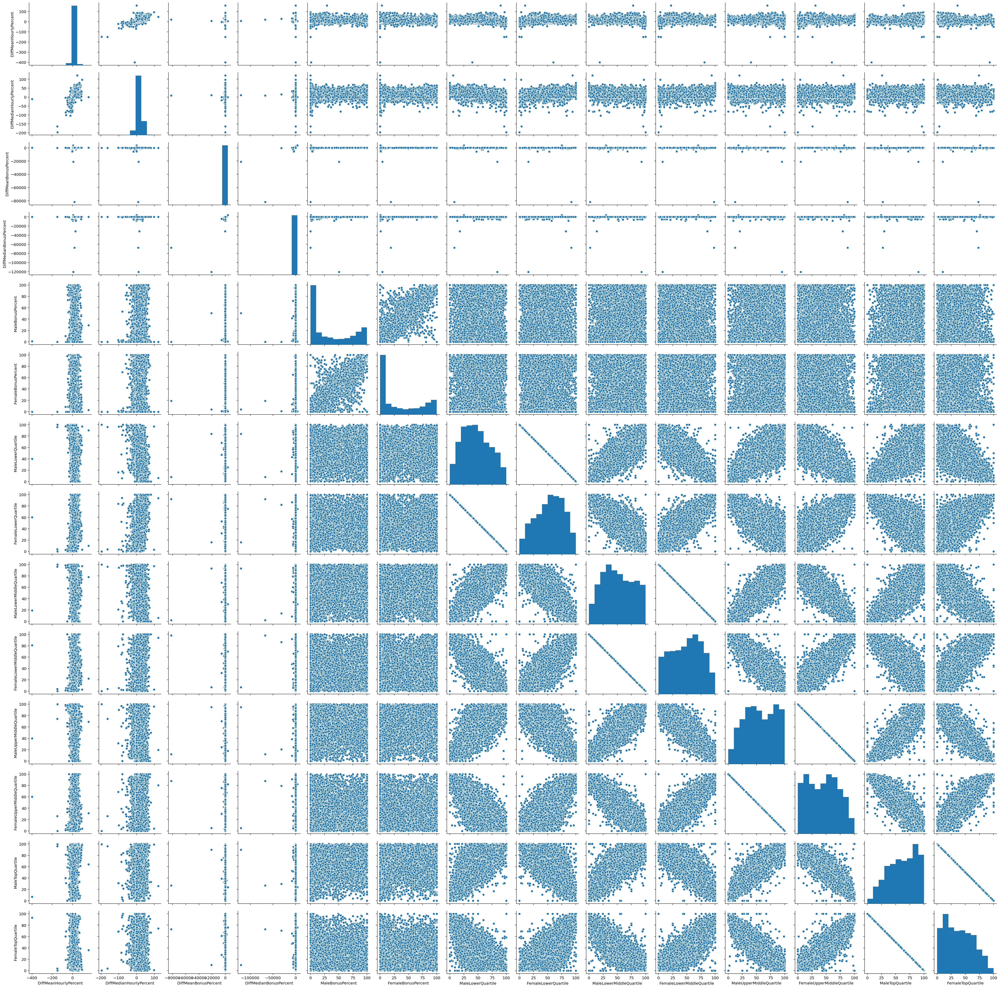

In [76]:

g = sns.pairplot(df[df.year=2017][[ 'DiffMeanHourlyPercent', 'DiffMedianHourlyPercent',
       'DiffMeanBonusPercent', 'DiffMedianBonusPercent',
       'MaleBonusPercent', 'FemaleBonusPercent', 'MaleLowerQuartile',
       'FemaleLowerQuartile', 'MaleLowerMiddleQuartile',
       'FemaleLowerMiddleQuartile', 'MaleUpperMiddleQuartile',
       'FemaleUpperMiddleQuartile', 'MaleTopQuartile',
       'FemaleTopQuartile','EmployerSize']], kind=scatter)

plt.show()

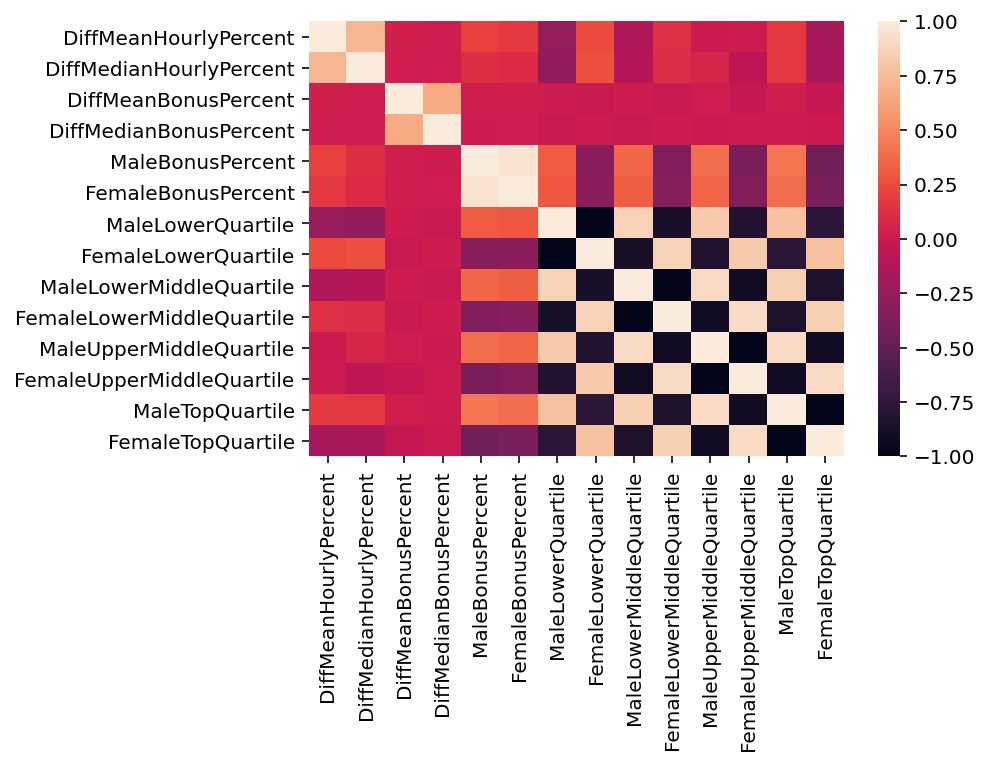

In [160]:
# Look for correlations in a heatmap
ax=sns.heatmap(df[[ 'DiffMeanHourlyPercent', 'DiffMedianHourlyPercent',
       'DiffMeanBonusPercent', 'DiffMedianBonusPercent',
       'MaleBonusPercent', 'FemaleBonusPercent', 'MaleLowerQuartile',
       'FemaleLowerQuartile', 'MaleLowerMiddleQuartile',
       'FemaleLowerMiddleQuartile', 'MaleUpperMiddleQuartile',
       'FemaleUpperMiddleQuartile', 'MaleTopQuartile',
       'FemaleTopQuartile','EmployerSize']].corr())

count    10075.000000
mean         7.300030
std        852.659416
min     -82000.000000
25%          0.000000
50%         22.500000
75%         53.200000
max       3848.200000
Name: DiffMeanBonusPercent, dtype: float64

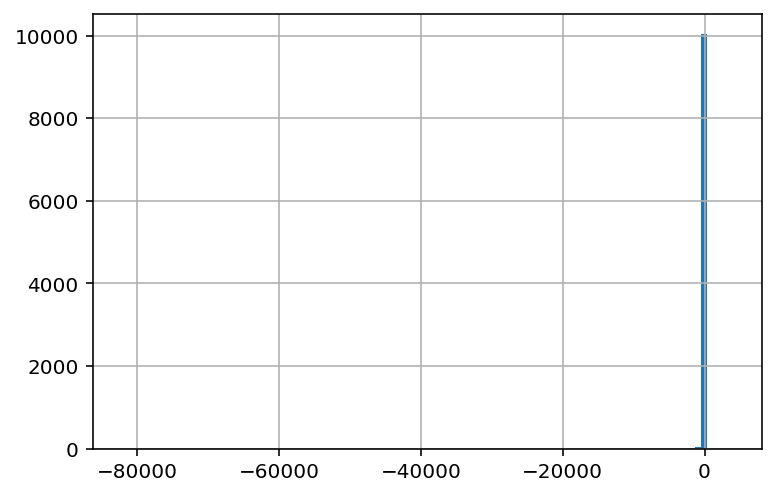

In [80]:
df.DiffMeanBonusPercent.hist(bins=100)
df.DiffMeanBonusPercent.describe()

In [159]:
#WHAT how does a company have an -82000% difference? This must be bad data
df[np.abs(df.DiffMeanBonusPercent) > 100][
    ['EmployerName', 'MaleBonusPercent', 'FemaleBonusPercent', 
     'DiffMeanBonusPercent', 'DiffMedianBonusPercent']
].sort_values(by='DiffMeanBonusPercent')

,EmployerName,MaleBonusPercent,FemaleBonusPercent,DiffMeanBonusPercent,DiffMedianBonusPercent
6815,PARSONS BAKERY LIMITED,0.0,19.0,-82000.0,-67400.0
6659,Optare Group Ltd,50.6,4.0,-21092.0,-120695.0
7446,R E PERSONNEL LIMITED,0.4,1.2,-13934.0,-13934.0
4373,HILL CARE LIMITED,2.6,0.5,-9900.0,-9900.0
8728,STEALTHWAVE LIMITED,3.0,1.0,-8412.0,-5859.0
...,...,...,...,...,...
2425,D&D LONDON LIMITED,5.1,7.5,369.7,38.9
7545,ROBINSON MEDICAL RECRUITMENT LIMITED,1.0,1.0,431.0,324.0
9742,UNIQUE CATERING AND MANAGEMENT SERVICES LIMITED,6.2,2.2,620.0,568.0
6636,ONE EDUCATION LIMITED,1.0,3.0,1918.3,0.0


In [180]:
# Do a QQ plot of all years


In [191]:
df.head()

,EmployerName,Address,SicCodes,DiffMeanHourlyPercent,DiffMedianHourlyPercent,DiffMeanBonusPercent,DiffMedianBonusPercent,MaleBonusPercent,FemaleBonusPercent,MaleLowerQuartile,...,CurrentName,year,Postcode,latitude,longitude,country,region,CleanedUpSic,CleanedUpSicLen,TranslatedSics
0,"""Bryanston School"",Incorporated","[Bryanston House, Blandford, Dorset, DT11 0PX]",85310,18.0,28.2,0.0,0.0,0.0,0.0,24.4,...,BRYANSTON SCHOOL INCORPORATED,2017,DT11 0PX,50.865687,-2.185542,England,South West,[85310],1,[General secondary education]
1,"""RED BAND"" CHEMICAL COMPANY, LIMITED","[19 Smith's Place, Leith Walk, Edinburgh, EH6 ...",47730,2.3,-2.7,15.0,37.5,15.6,66.7,20.3,...,"""RED BAND"" CHEMICAL COMPANY, LIMITED",2017,EH6 8NU,55.967066,-3.173121,Scotland,Scotland,[47730],1,[Dispensing chemist in specialised stores]
2,118 LIMITED,"[3 Alexandra Gate Ffordd Pengam, Ground Floor,...",61900,1.7,2.8,13.1,13.6,70.0,57.0,51.0,...,118 LIMITED,2017,CF24 2SA,51.491734,-3.134521,Wales,Wales,[61900],1,[Other telecommunications activities]
3,123 EMPLOYEES LTD,"[34 Roundhay Road, Leeds, England, LS7 1AB]",78300,41.0,36.0,-69.8,-157.2,50.0,73.5,0.0,...,123 EMPLOYEES LTD,2017,LS7 1AB,53.808597,-1.532078,England,Yorkshire and The Humber,[78300],1,[Human resources provision and management of h...
4,1610 LIMITED,"[Hestercombe House, Cheddon Fitzpaine, Taunton...",93110,-22.0,-34.0,-47.0,-67.0,25.0,75.0,56.0,...,1610 LIMITED,2017,TA2 8LG,51.049617,-3.088872,England,South West,[93110],1,[Operation of sports facilities]


In [194]:
df_exploded_by_sic = df.explode('TranslatedSics')
df_exploded_by_sic.head()

,EmployerName,Address,SicCodes,DiffMeanHourlyPercent,DiffMedianHourlyPercent,DiffMeanBonusPercent,DiffMedianBonusPercent,MaleBonusPercent,FemaleBonusPercent,MaleLowerQuartile,...,CurrentName,year,Postcode,latitude,longitude,country,region,CleanedUpSic,CleanedUpSicLen,TranslatedSics
0,"""Bryanston School"",Incorporated","[Bryanston House, Blandford, Dorset, DT11 0PX]",85310,18.0,28.2,0.0,0.0,0.0,0.0,24.4,...,BRYANSTON SCHOOL INCORPORATED,2017,DT11 0PX,50.865687,-2.185542,England,South West,[85310],1,General secondary education
1,"""RED BAND"" CHEMICAL COMPANY, LIMITED","[19 Smith's Place, Leith Walk, Edinburgh, EH6 ...",47730,2.3,-2.7,15.0,37.5,15.6,66.7,20.3,...,"""RED BAND"" CHEMICAL COMPANY, LIMITED",2017,EH6 8NU,55.967066,-3.173121,Scotland,Scotland,[47730],1,Dispensing chemist in specialised stores
2,118 LIMITED,"[3 Alexandra Gate Ffordd Pengam, Ground Floor,...",61900,1.7,2.8,13.1,13.6,70.0,57.0,51.0,...,118 LIMITED,2017,CF24 2SA,51.491734,-3.134521,Wales,Wales,[61900],1,Other telecommunications activities
3,123 EMPLOYEES LTD,"[34 Roundhay Road, Leeds, England, LS7 1AB]",78300,41.0,36.0,-69.8,-157.2,50.0,73.5,0.0,...,123 EMPLOYEES LTD,2017,LS7 1AB,53.808597,-1.532078,England,Yorkshire and The Humber,[78300],1,Human resources provision and management of hu...
4,1610 LIMITED,"[Hestercombe House, Cheddon Fitzpaine, Taunton...",93110,-22.0,-34.0,-47.0,-67.0,25.0,75.0,56.0,...,1610 LIMITED,2017,TA2 8LG,51.049617,-3.088872,England,South West,[93110],1,Operation of sports facilities


In [252]:
tmp_df = df_exploded_by_sic[['DiffMeanHourlyPercent', 'DiffMedianHourlyPercent','DiffMeanBonusPercent', 'TranslatedSics',  'MaleLowerQuartile',
       'FemaleLowerQuartile', 'MaleLowerMiddleQuartile',
       'FemaleLowerMiddleQuartile', 'MaleUpperMiddleQuartile',
       'FemaleUpperMiddleQuartile', 'MaleTopQuartile',
       'FemaleTopQuartile',]]
tmp_df.groupby('TranslatedSics').mean()  # Is this a fair way to weight them? Can't we weight by company size?
x = tmp_df.groupby('TranslatedSics').count().sort_values(by='DiffMeanHourlyPercent')
x.sample(20)

,DiffMeanHourlyPercent,DiffMedianHourlyPercent,DiffMeanBonusPercent,MaleLowerQuartile,FemaleLowerQuartile,MaleLowerMiddleQuartile,FemaleLowerMiddleQuartile,MaleUpperMiddleQuartile,FemaleUpperMiddleQuartile,MaleTopQuartile,FemaleTopQuartile
TranslatedSics,,,,,,,,,,,
Binding and related services,2,2,2,2,2,2,2,2,2,2,2
Retail sale of watches and jewellery in specialised stores,30,30,29,30,30,30,30,30,30,30,30
"Manufacture of non-electronic measuring, testing etc. equipment, not for industrial process control",2,2,2,2,2,2,2,2,2,2,2
Manufacture of other inorganic basic chemicals,31,31,31,31,31,31,31,31,31,31,31
"Retail sale of hardware, paints and glass in specialised stores",29,29,29,29,29,29,29,29,29,29,29
Credit granting by non-deposit taking finance houses and other specialist consumer credit grantors,45,45,45,45,45,45,45,45,45,45,45
Management consultancy activities other than financial management,145,145,135,145,145,145,145,145,145,145,145
Manufacture of locks and hinges,5,5,5,5,5,5,5,5,5,5,5
Manufacture of mortars,2,2,2,2,2,2,2,2,2,2,2


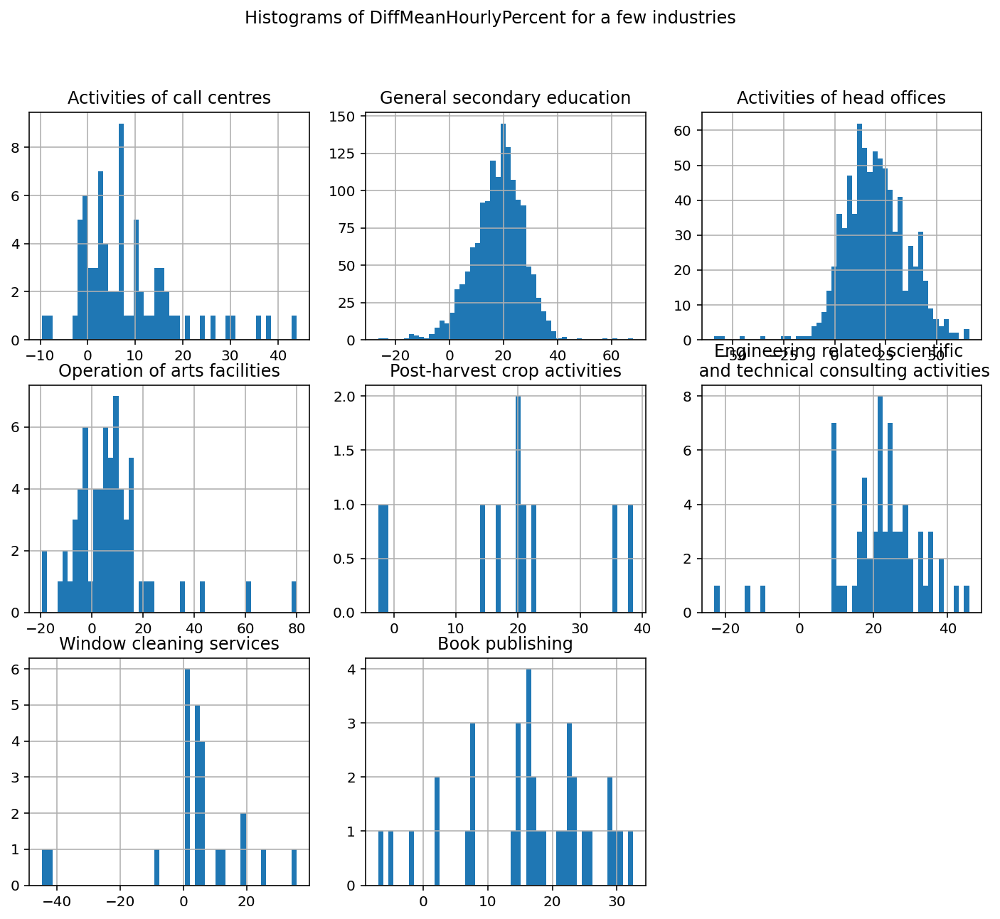

In [253]:
# Looks like some cells are N/A!
plt.figure(figsize=(12,10))
plt.subplot(331)
plt.suptitle('Histograms of DiffMeanHourlyPercent for a few industries')
plt.title('Activities of call centres')
tmp_df[tmp_df.TranslatedSics == 'Activities of call centres']['DiffMeanHourlyPercent'].hist(bins=50)
plt.subplot(332)
plt.title('General secondary education')
tmp_df[tmp_df.TranslatedSics == 'General secondary education']['DiffMeanHourlyPercent'].hist(bins=50)
plt.subplot(333)
plt.title('Activities of head offices')
tmp_df[tmp_df.TranslatedSics == 'Activities of head offices']['DiffMeanHourlyPercent'].hist(bins=50)

plt.subplot(334)
plt.title('Operation of arts facilities')
tmp_df[tmp_df.TranslatedSics == 'Operation of arts facilities']['DiffMeanHourlyPercent'].hist(bins=50)

plt.subplot(335)
plt.title('Post-harvest crop activities')
tmp_df[tmp_df.TranslatedSics == 'Post-harvest crop activities']['DiffMeanHourlyPercent'].hist(bins=50)

plt.subplot(336)
plt.title('Engineering related scientific \n and technical consulting activities')
tmp_df[tmp_df.TranslatedSics == 'Engineering related scientific and technical consulting activities']['DiffMeanHourlyPercent'].hist(bins=50)

plt.subplot(337)
plt.title('Window cleaning services')
tmp_df[tmp_df.TranslatedSics == 'Window cleaning services']['DiffMeanHourlyPercent'].hist(bins=50)

plt.subplot(338)
plt.title('Book publishing')
tmp_df[tmp_df.TranslatedSics == 'Book publishing']['DiffMeanHourlyPercent'].hist(bins=50)

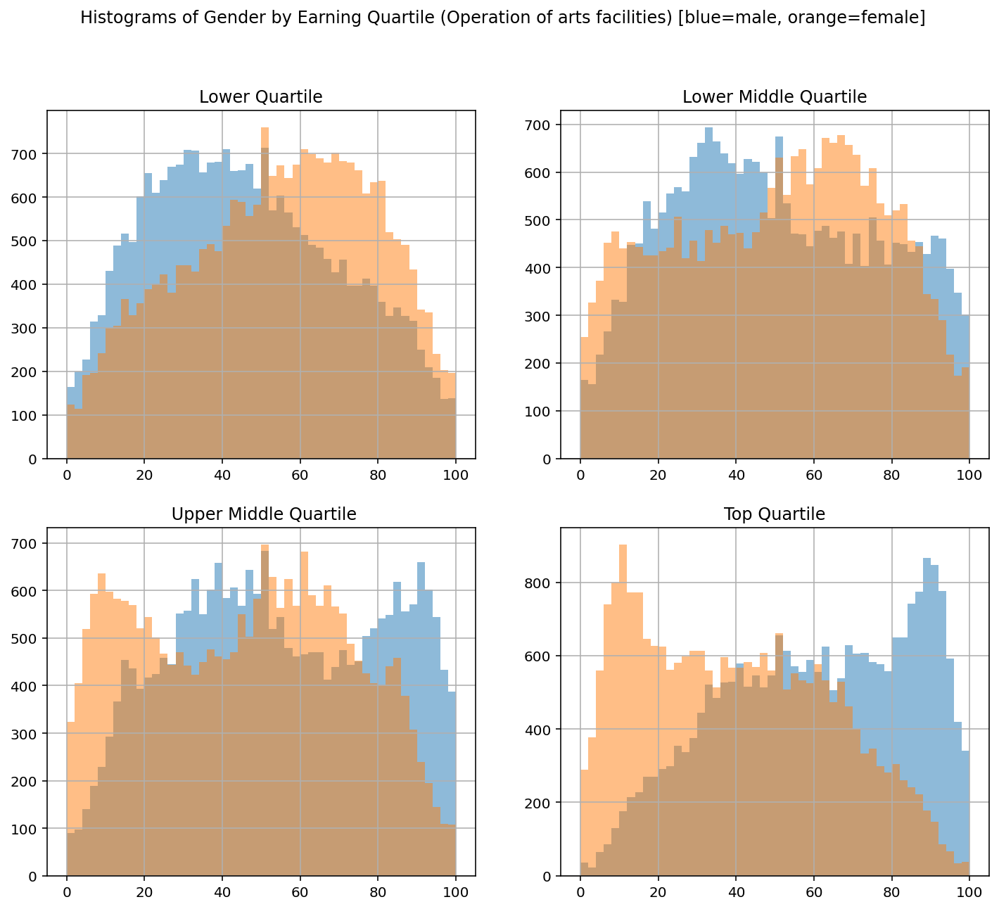

In [254]:
plt.figure(figsize=(12,10))
plt.subplot(221)
plt.suptitle('Histograms of Gender by Earning Quartile (all industries) [blue=male, orange=female]')
plt.title('Lower Quartile')
df['MaleLowerQuartile'].hist(bins=50, alpha=0.5)
df['FemaleLowerQuartile'].hist(bins=50, alpha=0.5)

plt.subplot(222)
plt.title('Lower Middle Quartile')
df['MaleLowerMiddleQuartile'].hist(bins=50, alpha=0.5)
df['FemaleLowerMiddleQuartile'].hist(bins=50, alpha=0.5)

plt.subplot(223)
plt.title(' Upper Middle Quartile')
df['MaleUpperMiddleQuartile'].hist(bins=50,  alpha=0.5)
df['FemaleUpperMiddleQuartile'].hist(bins=50,  alpha=0.5)
plt.subplot(224)
plt.title('Top Quartile')
df['MaleTopQuartile'].hist(bins=50,  alpha=0.5)
df['FemaleTopQuartile'].hist(bins=50,  alpha=0.5)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x1bd92fb50>],
      dtype=object)

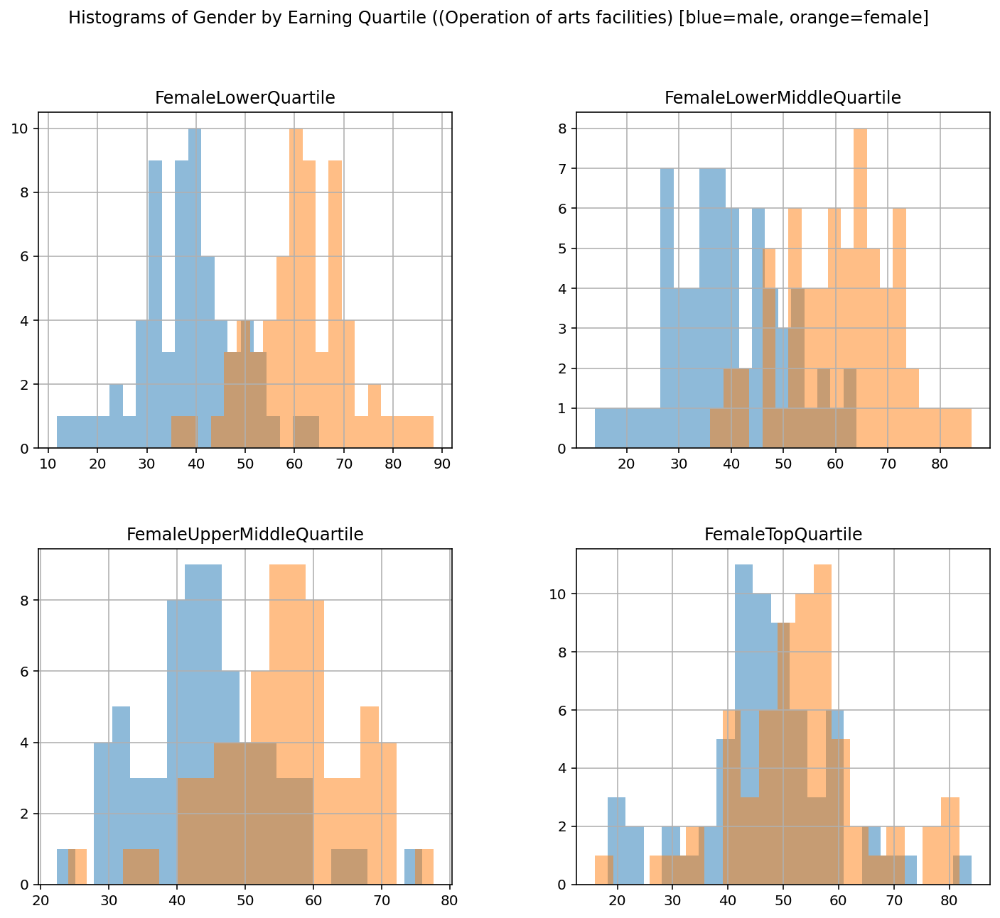

In [265]:
plt.figure(figsize=(12,10))
plt.suptitle('Histograms of Gender by Earning Quartile ((Operation of arts facilities) [blue=male, orange=female]')

ax = plt.subplot(221)
plt.title('Lower Quartile')
tmp_df[tmp_df.TranslatedSics == 'Operation of arts facilities'][['MaleLowerQuartile']].hist(bins=20, alpha=0.5,ax=ax)
tmp_df[tmp_df.TranslatedSics == 'Operation of arts facilities'][['FemaleLowerQuartile']].hist(bins=20, alpha=0.5,ax=ax)

ax = plt.subplot(222)
plt.title('Lower Middle Quartile')
tmp_df[tmp_df.TranslatedSics == 'Operation of arts facilities'][['MaleLowerMiddleQuartile']].hist(bins=20, alpha=0.5,ax=ax)
tmp_df[tmp_df.TranslatedSics == 'Operation of arts facilities'][['FemaleLowerMiddleQuartile']].hist(bins=20, alpha=0.5,ax=ax)

ax= plt.subplot(223)
plt.title(' Upper Middle Quartile')
tmp_df[tmp_df.TranslatedSics == 'Operation of arts facilities'][['MaleUpperMiddleQuartile']].hist(bins=20,  alpha=0.5,ax=ax)
tmp_df[tmp_df.TranslatedSics == 'Operation of arts facilities'][['FemaleUpperMiddleQuartile']].hist(bins=20,  alpha=0.5,ax=ax)
ax= plt.subplot(224)
plt.title('Top Quartile')
tmp_df[tmp_df.TranslatedSics == 'Operation of arts facilities'][['MaleTopQuartile']].hist(bins=20,  alpha=0.5,ax=ax)
tmp_df[tmp_df.TranslatedSics == 'Operation of arts facilities'][['FemaleTopQuartile']].hist(bins=20,  alpha=0.5,ax=ax)

In [270]:
tmp_df['TranslatedSics'].unique()

array(['General secondary education',
       'Dispensing chemist in specialised stores',
       'Other telecommunications activities',
       'Human resources provision and management of human resources functions',
       'Operation of sports facilities', 'Event catering activities',
       'Management consultancy activities other than financial management',
       'Fitness facilities',
       'Other amusement and recreation activities n.e.c.',
       'Other human health activities',
       'Social work activities without accommodation for the elderly and disabled',
       'Other food services', 'Raising of poultry',
       'Manufacture of prepared feeds for farm animals',
       'Processing and preserving of poultry meat',
       'Processing and preserving of meat', 'Activities of call centres',
       'Take-away food shops and mobile food stands',
       'Other transportation support activities',
       'Temporary employment agency activities',
       'General medical practice activi

array([<matplotlib.axes._subplots.AxesSubplot object at 0x1b8b6a050>],
      dtype=object)

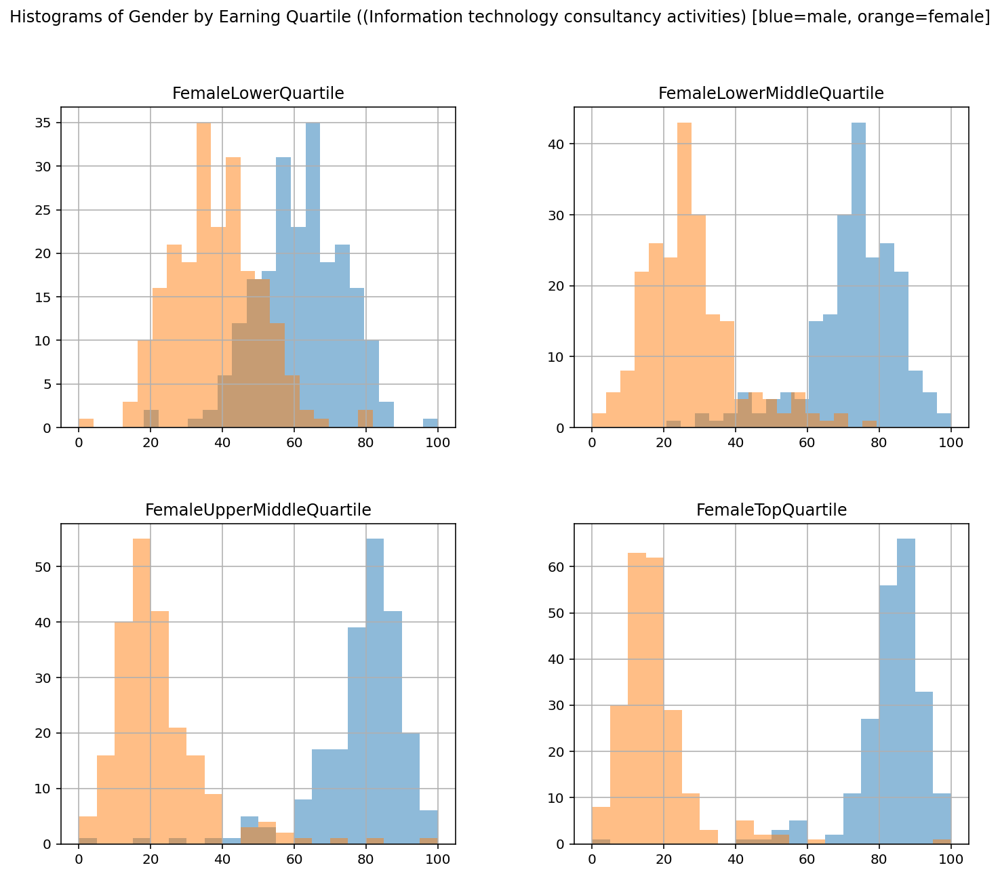

In [273]:
key = 'Information technology consultancy activities'
plt.figure(figsize=(12,10))
plt.suptitle('Histograms of Gender by Earning Quartile ((Information technology consultancy activities) [blue=male, orange=female]')

ax = plt.subplot(221)
plt.title('Lower Quartile')
tmp_df[tmp_df.TranslatedSics == key][['MaleLowerQuartile']].hist(bins=20, alpha=0.5,ax=ax)
tmp_df[tmp_df.TranslatedSics == key][['FemaleLowerQuartile']].hist(bins=20, alpha=0.5,ax=ax)

ax = plt.subplot(222)
plt.title('Lower Middle Quartile')
tmp_df[tmp_df.TranslatedSics == key][['MaleLowerMiddleQuartile']].hist(bins=20, alpha=0.5,ax=ax)
tmp_df[tmp_df.TranslatedSics == key][['FemaleLowerMiddleQuartile']].hist(bins=20, alpha=0.5,ax=ax)

ax= plt.subplot(223)
plt.title(' Upper Middle Quartile')
tmp_df[tmp_df.TranslatedSics == key][['MaleUpperMiddleQuartile']].hist(bins=20,  alpha=0.5,ax=ax)
tmp_df[tmp_df.TranslatedSics == key][['FemaleUpperMiddleQuartile']].hist(bins=20,  alpha=0.5,ax=ax)
ax= plt.subplot(224)
plt.title('Top Quartile')
tmp_df[tmp_df.TranslatedSics == key][['MaleTopQuartile']].hist(bins=20,  alpha=0.5,ax=ax)
tmp_df[tmp_df.TranslatedSics == key][['FemaleTopQuartile']].hist(bins=20,  alpha=0.5,ax=ax)